# End to End multi class dog breed classification using TF 2.0 and TF Hub

In [ ]:
 #!unzip "drive/MyDrive/Dog Breed Identification/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Breed Identification/Data New"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/Dog Breed Identification/Data New/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/Dog Breed Identification/Data New/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/Dog Breed Identification/Data New/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/Dog Breed Identification/Data New/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/Dog Breed Identification/Data New/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/Dog Breed Identification/Data New/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/Dog Breed Identification/Data New/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/Dog Breed Identification/Data New/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/drive/M

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from imutils import paths
count_data = '/content/drive/MyDrive/Dog Breed Identification/Data New/test'
total_data = len(list(paths.list_images(count_data)))
print("Total data: ", total_data)

Total data:  10357


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub

print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


## Getting data ready: Converting our data into tensors - numerical representation

In [ ]:
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Breed Identification/Data New/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

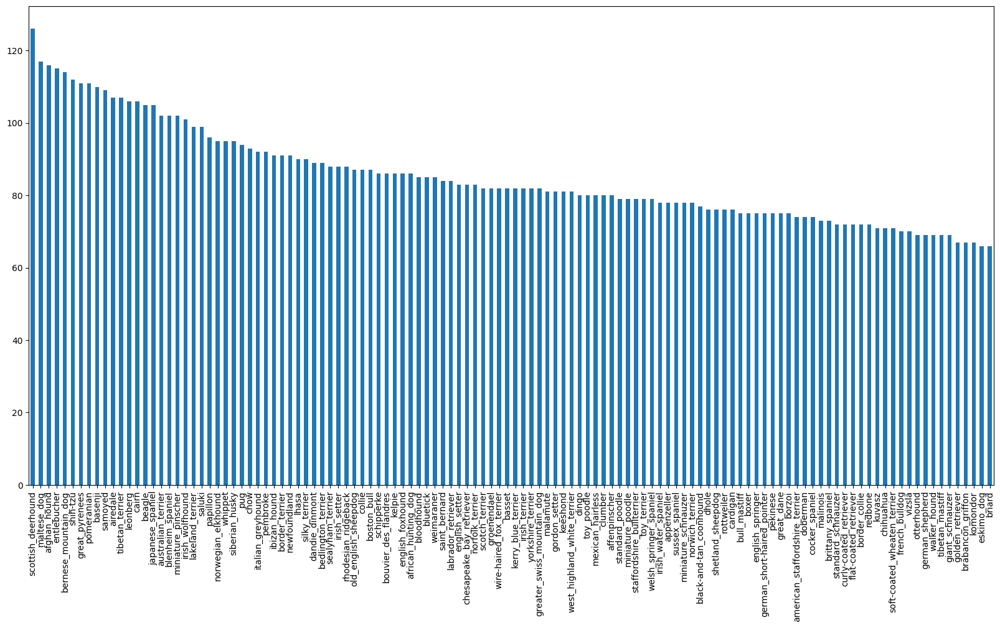

In [ ]:
# How many images per class/ Breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

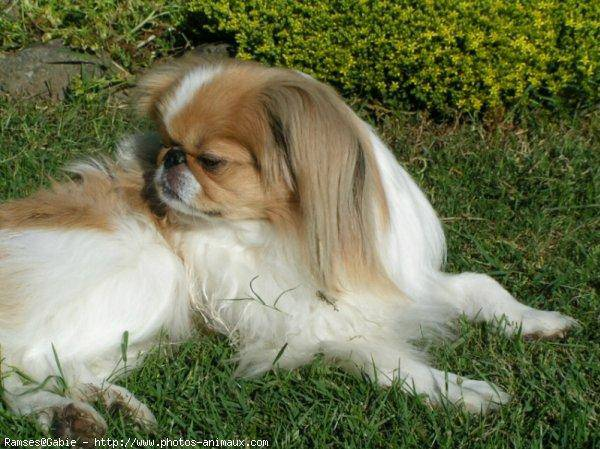

In [ ]:
# Viewing an image
from IPython.display import Image
Image('/content/drive/MyDrive/Dog Breed Identification/Data New/test/000621fb3cbb32d8935728e48679680e.jpg')

## Getting images and thier labels

Lets get a list of all images and pathnames

In [ ]:
# Create pathnames from image IDs

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filenames = ["/content/drive/MyDrive/Dog Breed Identification/Data New/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['/content/drive/MyDrive/Dog Breed Identification/Data New/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train

In [ ]:
# Check wether number of filenames matches the number of actual image of files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Breed Identification/Data New/train/")) == len(filenames):
  print("T")
else:
  print("F")

T


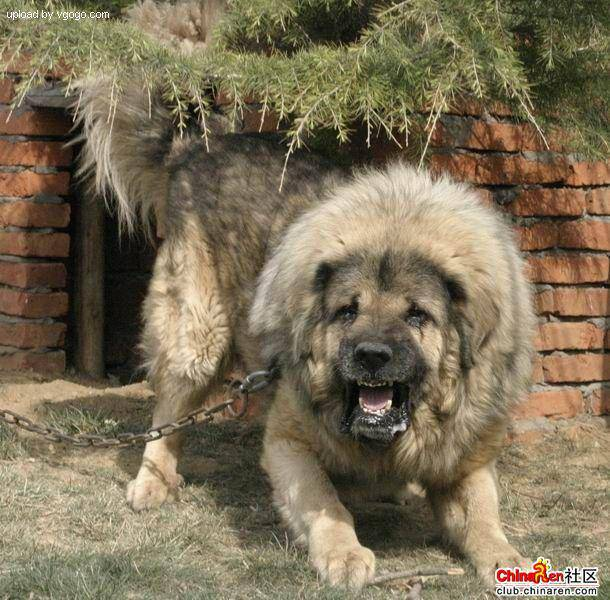

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Lets prepare the labels

In [ ]:
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches number of filenames
if len(labels) == len(filenames):
  print("T")

T


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
boolean_labels = [label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean arrays into integers
print(labels[0])
print(np.where(unique_breeds==labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filenames[:10]

['/content/drive/MyDrive/Dog Breed Identification/Data New/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/Data New/train

### Create our own validation set

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

Start with 1000 images and increase as we need

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:100, max:10000, step:100}

In [ ]:
# Split into train and val
from sklearn.model_selection import train_test_split

# Split into train and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocessing images - turning images into tensors

Writing a function for:
1. Take an image filepath as input
2. Use TF to read file and save it in a variable
3. Turn the image into tensors
4. Resize the image to 224, 224
5. Return the modified image

In [ ]:
# Convert image to nparray
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# Turn the image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

Writing a function for:
1. Take an image filepath as input
2. Use TF to read file and save it in a variable
3. Turn the image into tensors
4. Normalise the image from 0-255 to 0-1
5. Resize the image to 224, 224
6. Return the modified image

In [ ]:
import tensorflow as tf

# Define the image size
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
    # 1 and 2
    image = tf.io.read_file(image_path)

    # 3 - RGB
    image = tf.image.decode_jpeg(image, channels=3)  # Change channels to 3

    # Convert the color channel values from 0-255 to 0-1 (normalization)
    image = tf.image.convert_image_dtype(image, tf.float32)  # Change convert_image_dtype

    # Resize the image to 224, 224
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

    return image

## Turning our data into batches

batches - Number of images we take at a single time to avoid all not fitting into memory

Ideal batch size = 32

Inorder to use TF effectively, we need to have our data in the form of tensor tuples which look like '(image, label)'

In [ ]:
# Create a simple function to return a tuple of tensors
def get_image_label(image_path, label):

  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
#Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, 
                        test_data=False):
  """
  Creates batches of data in X and y pairs
  """
  # If data is test dataset, we dont have labels
  if test_data:

    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) 
    # Only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)

    return data_batch
  
  # If the data is validation data, we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # Filepaths
                                               tf.constant(y)))# Labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  
  else:
    print("Creating training data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    
    # Shuffle the pathnames and labels before mapping image processor function is faster
    data = data.shuffle(buffer_size=len(X))
    
    # Create (image, label) tuples and turn it into a preprocessed image
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)

    return data_batch

In [ ]:
# Create training and validation data batches 
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches
Creating validation data batches


In [ ]:
# Check different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualise data batches

Our data is now in batches which can be difficult to understand hence visualisation is important

In [ ]:
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and thier labels
  """
  # Setup the figure
  plt.figure(figsize=(10,10))

  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    # Display the image
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[4.46337968e-01, 4.46551174e-01, 4.38068390e-01],
          [4.91671711e-01, 4.95593280e-01, 4.75985438e-01],
          [5.78616500e-01, 5.82538068e-01, 5.62930226e-01],
          ...,
          [4.91996884e-01, 6.03306293e-01, 4.56192911e-01],
          [4.01257932e-01, 5.32684028e-01, 4.24288511e-01],
          [2.82371134e-01, 4.19287175e-01, 3.30687404e-01]],
 
         [[4.36319560e-01, 4.38848704e-01, 4.22778517e-01],
          [5.28754652e-01, 5.32676220e-01, 5.11440217e-01],
          [5.51566303e-01, 5.55487871e-01, 5.34251869e-01],
          ...,
          [5.26402593e-01, 6.46097839e-01, 5.12134075e-01],
          [4.54135239e-01, 5.88396370e-01, 4.88655537e-01],
          [4.27592605e-01, 5.74897826e-01, 4.93620962e-01]],
 
         [[4.30226475e-01, 4.34148073e-01, 4.05924886e-01],
          [4.86506492e-01, 4.90428060e-01, 4.61471498e-01],
          [4.87481296e-01, 4.91402864e-01, 4.62446272e-01],
          ...,
          [4.84334797e-01, 6.16887152e-01, 4.9762

In [ ]:
len(train_images), len(train_labels)

(32, 32)

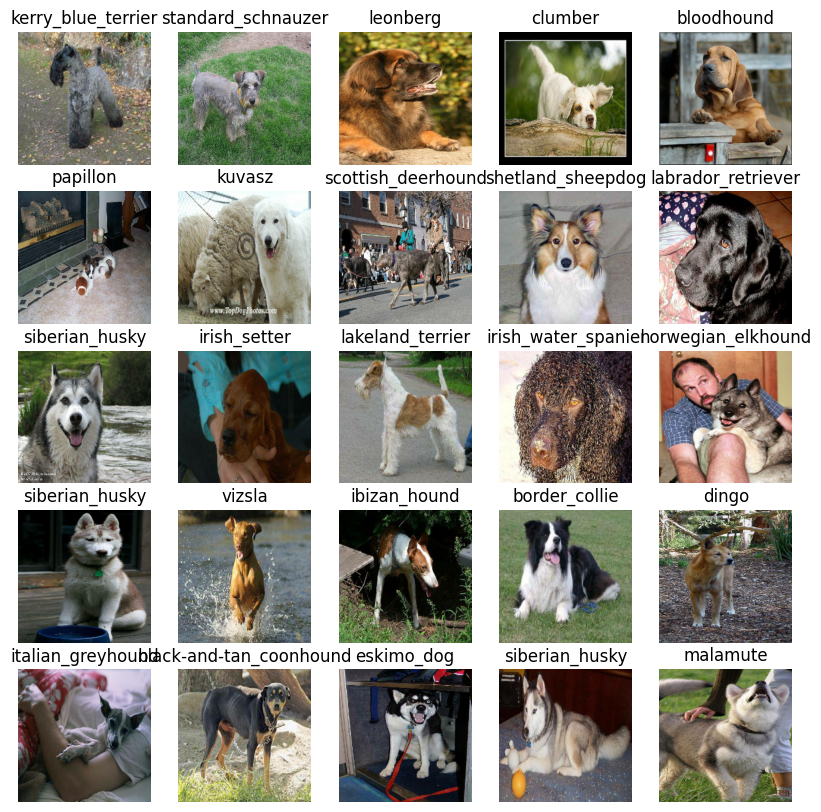

In [ ]:
# Now lets visualise the data in a training batch
show_25_images(train_images, train_labels)

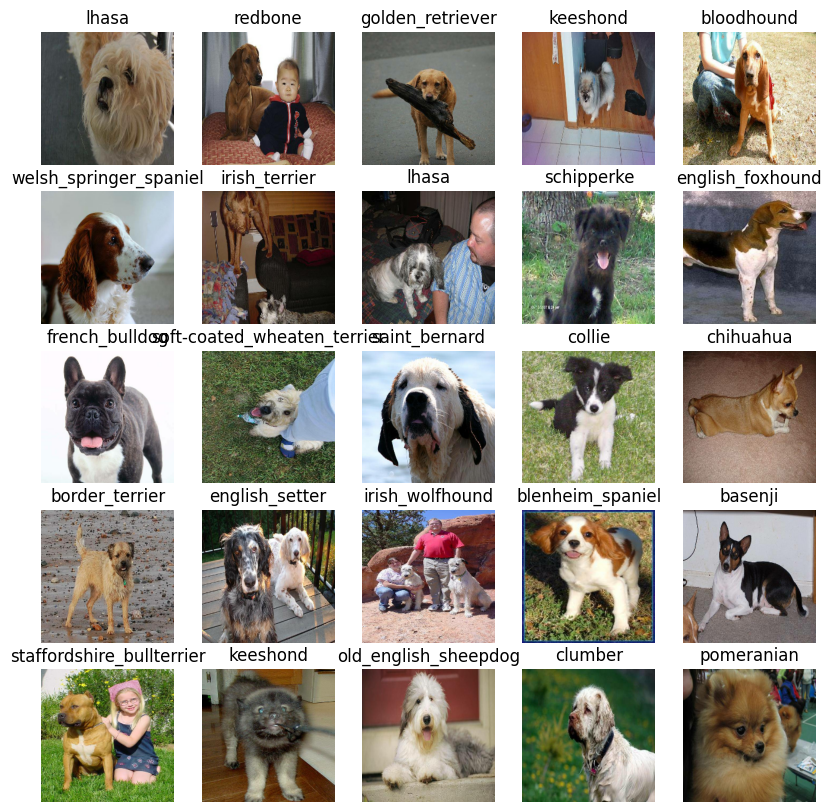

In [ ]:
# Try on validation set
val_images, val_labels = next(train_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a machine learning model

Before we build a model, there are a few things that we need to define:
1. Input Shape (in the form of tensors)
2. Output shape (image labels in tensors)
3. URL of the model we want to use - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, Height, width, color channels

# Setup the output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup a model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

As we have our inputs outputs and our model ready to go, now we will put them into a keras model

1. Create a function that takes input shape, output shape, and model chosen
2. Define the layers in a Keras sequential model
3. Compile the model (how it should be evaluated and improved)
4. Build the model (tell the model about the kind and the input shape it'll be getting)
5. Return the model


In [ ]:
# Create a function that builds keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do things like saving its progress, checking its progress or stop training early if model stops improving

We will create 2 callbacks, one for TensorBoard which helps to track progress and one for early stopping which prevents our model from training for too long

### TensorBoard Callback

To setup a tensorboard callback, we need to do 3 things:
1. Load the tensorboard notebook extension
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our models 'fit()' function
3. Visualise our models training logs with the %tensorboard magic functions

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  # Create a log directory for storing tensorboard logs
  logdir = os.path.join('drive/MyDrive/Dog Breed Identification/logs',
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(log_dir=logdir)

### Early stopping callback

Used to prevent overfitting. Early stopping helps stop our model by stopping training if a certain evaluation metric stops improving

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", 
                                                  patience=3)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images to make sure everything is working successfully


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a gpu
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Lets create a simple function which trains a model

* Create a model using 'create model()'
* Setup a TensorBoard callback using 'create_tensorboard_callback()'
* call the fit function by passing the data and the epochs and the callbacks
* return the model

In [ ]:
# Build a function to train and return the trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create a new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 191s 7s/step - loss: 4.6659 - accuracy: 0.0975 - val_loss: 3.4464 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 3s 116ms/step - loss: 1.6537 - accuracy: 0.6687 - val_loss: 2.2399 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 3s 117ms/step - loss: 0.5782 - accuracy: 0.9350 - val_loss: 1.7441 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 4s 159ms/step - loss: 0.2612 - accuracy: 0.9875 - val_loss: 1.5207 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 3s 122ms/step - loss: 0.1502 - accuracy: 0.9962 - val_loss: 1.4531 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 4s 142ms/step - loss: 0.1021 - accuracy: 0.9987 - val_loss: 1.4062 - val_accuracy: 0.6000
Epoch 7/100
25/25 [==============================

### Clearly, the model is overfitting because it reaches 100% accuracy on the training data

### Checking the tensorboard logs

The tensorboard magic function will access the logs directory and visualise its contents

In [ ]:
#pip uninstall tb-nightly tensorboardX tensorboard

In [ ]:
#pip install -U tensorboard

In [ ]:
# Load tensorboard logs
%tensorboard --logdir drive/MyDrive/Dog\ Breed\ Identification/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 86ms/step


array([[8.02031811e-03, 1.08698376e-04, 3.56775883e-04, ...,
        5.13811130e-04, 4.52449931e-05, 5.71134593e-03],
       [1.16089080e-02, 7.78925780e-04, 1.88740827e-02, ...,
        2.82706390e-03, 4.78180544e-03, 4.12038324e-04],
       [4.14334907e-04, 5.90034004e-04, 2.39359961e-05, ...,
        2.54892744e-04, 4.84154822e-04, 3.05212452e-04],
       ...,
       [5.49952056e-05, 1.96679815e-04, 1.45533981e-04, ...,
        9.67537708e-05, 1.28969288e-04, 2.90914351e-04],
       [6.20127982e-03, 4.95717359e-05, 1.23802543e-04, ...,
        2.73341662e-04, 4.44936995e-05, 3.00746523e-02],
       [5.13025746e-03, 1.30602066e-05, 1.45843381e-03, ...,
        5.41755557e-03, 5.20429166e-04, 2.79377346e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(predictions[0])

120

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[9.18315636e-05 3.25622066e-04 3.24370994e-05 8.24436484e-06
 1.87860313e-03 4.61413874e-05 1.26615560e-04 8.07225821e-04
 1.03283376e-02 7.20618963e-02 3.78576624e-05 1.59660303e-05
 3.74463969e-04 8.28646589e-04 6.21284882e-04 2.00881413e-03
 2.68214790e-05 1.47103594e-04 2.35487300e-04 8.59997381e-05
 3.13851342e-05 3.67734785e-04 1.63526693e-05 5.92426704e-06
 6.23358879e-03 1.03473445e-04 8.73123063e-05 6.10150528e-05
 3.35612101e-04 3.41204141e-04 2.92991699e-05 1.61705029e-04
 5.43884780e-05 8.43405287e-05 5.15108222e-05 3.60228914e-05
 3.10973235e-04 1.30945351e-04 1.85303379e-05 1.05147742e-01
 1.77663620e-04 5.76020866e-05 4.29839408e-03 1.40438242e-05
 8.72710953e-05 6.32760639e-05 2.89967895e-04 5.87438466e-04
 5.80878659e-05 5.13057923e-04 6.23112210e-05 9.07149588e-05
 2.48577853e-04 1.83080789e-03 9.40676691e-05 1.67507693e-04
 2.97103397e-04 3.26368026e-05 3.32579184e-05 6.93198162e-05
 8.24880481e-05 1.59421194e-04 6.51114624e-06 7.51653351e-05
 8.76200138e-05 1.087332

Having the above functionality is great but we should be able to do it at scale

Even better if predicted image is also displayed

**Note:** Prediction probabilites are also known as confidence intervals

In [ ]:
# Turn prediction probabilites  into their respective labels, easier to understand
def get_pred_labels(prediction_probabilites):

  return unique_breeds[np.argmax(prediction_probabilites)]

# Get a predicted label based on an array of prediction probabilites
pred_label = get_pred_labels(predictions[81])
pred_label

'dingo'

Unbatch the validation dataset to make predictions on the validatuon images and compare to the truth labels

In [ ]:
def unbatchify(val_data):
  # Unbatch the dataset
  images_ = []
  labels_ = []

  # Loop through the unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])

  return images_, labels_

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_labels(val_labels[0])

'affenpinscher'

In [ ]:
get_pred_labels(predictions[0])

'cairn'

Now we have got ways to get the prediction, validation labels and validation images

Make a function to make them more visual

In [ ]:
def plot_pred(prediction_probabilites, labels, images, n=1):

  pred_prob, true_label, image = prediction_probabilites[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_labels(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "g"
  else:
    color = "r"
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
            color=color)
  

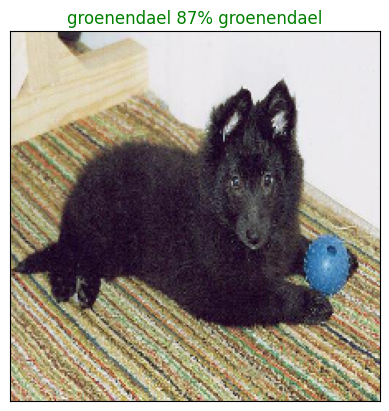

In [ ]:
plot_pred(prediction_probabilites=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now, view top 10 predictions

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get pred label
  pred_label = get_pred_labels(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 confidence valeus
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

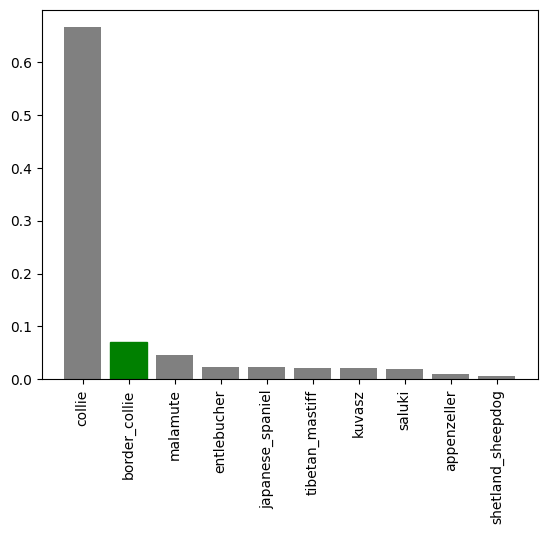

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

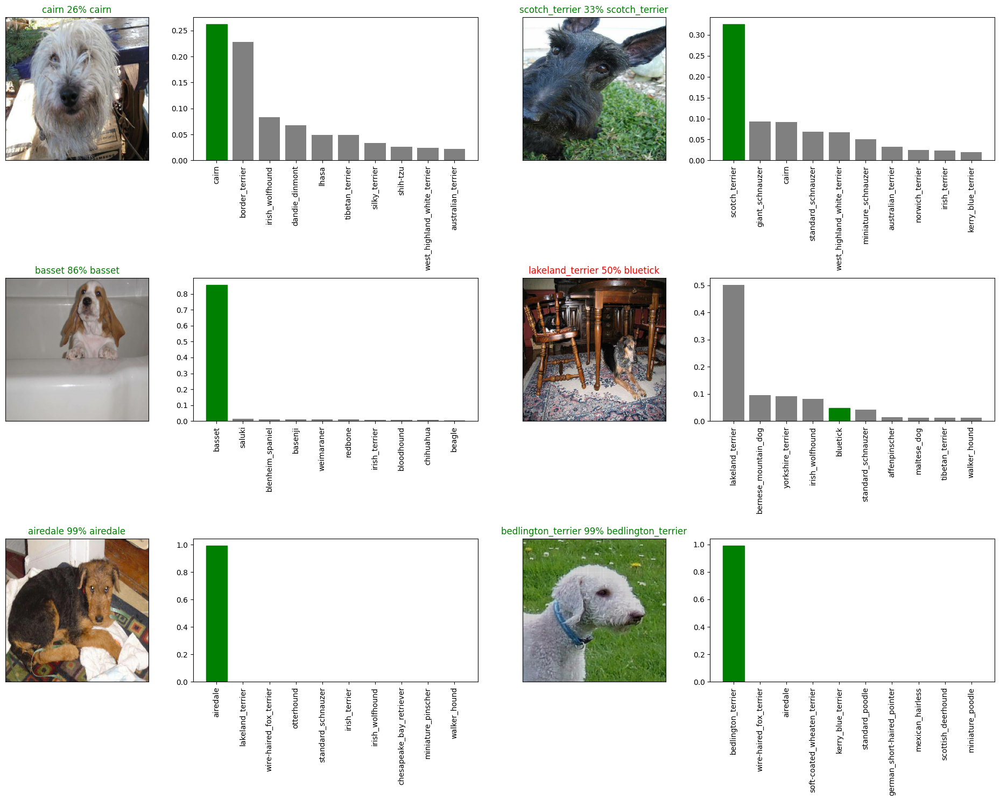

In [ ]:
# Check few predictions
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilites=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  
  plt.tight_layout(h_pad=1.0)
  
plt.show()


## Saving and reloading a trained model



In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):

  modeldir = os.path.join('/content/drive/MyDrive/Dog Breed Identification/Models',
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  
  model_path = modeldir + "-" + suffix + ".h5"

  print(f"Saving model to: {model_path}")

  model.save(model_path)

  return model_path

In [ ]:
# Create a function to load a model
def load_model(model_path):
  print(f"Loading the saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  
  return model


In [ ]:
# Save the 1000 images models
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Breed Identification/Models/20230606-13321686058354-1000-images-mobilenetv2-Adam.h5


'/content/drive/MyDrive/Dog Breed Identification/Models/20230606-13321686058354-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model = load_model(model_path='/content/drive/MyDrive/Dog Breed Identification/Models/20230606-13321686058354-1000-images-mobilenetv2-Adam.h5')

Loading the saved model from: /content/drive/MyDrive/Dog Breed Identification/Models/20230606-13321686058354-1000-images-mobilenetv2-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.3206 - accuracy: 0.6150


[1.3205684423446655, 0.6150000095367432]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 89ms/step - loss: 1.3206 - accuracy: 0.6150


[1.3205684423446655, 0.6150000095367432]

## Training a model on full dataset

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(X, y)

Creating training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model 
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation when training on full data, so we cant monitor with early stopping
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the model
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 108ms/step - loss: 1.3755 - accuracy: 0.6663
Epoch 2/100
320/320 [==============================] - 33s 103ms/step - loss: 0.4016 - accuracy: 0.8833
Epoch 3/100
320/320 [==============================] - 33s 104ms/step - loss: 0.2384 - accuracy: 0.9381
Epoch 4/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1543 - accuracy: 0.9619
Epoch 5/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1049 - accuracy: 0.9800
Epoch 6/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0764 - accuracy: 0.9876
Epoch 7/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0601 - accuracy: 0.9910
Epoch 8/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0458 - accuracy: 0.9953
Epoch 9/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0373 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 33s 103m

In [ ]:
save_model(model, suffix="full-model-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Breed Identification/Models/20230606-13531686059587-full-model-mobilenetv2-Adam.h5


'/content/drive/MyDrive/Dog Breed Identification/Models/20230606-13531686059587-full-model-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model('/content/drive/MyDrive/Dog Breed Identification/Models/20230606-13531686059587-full-model-mobilenetv2-Adam.h5')

Loading the saved model from: /content/drive/MyDrive/Dog Breed Identification/Models/20230606-13531686059587-full-model-mobilenetv2-Adam.h5


## Make predictions on the test dataset

1. Get the test image filenames
2. Convert to test data batches using create_data_batches() and Setting the test_data parameter to 'true'
3. Make predictions array by passing the test batches to predict()

In [ ]:
# Load the test image filenames
test_path = '/content/drive/MyDrive/Dog Breed Identification/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Breed Identification/test/c90109fe5971384b82dc9d4085609d5b.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/test/c9d0973ef495ae244ccbada81d356bf2.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/test/cdc0eea2d672f69a082f4b86797b0a51.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/test/c3bc90f915fe61ddaba580cf3bb7cacf.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/test/c8d37c827497b30794b97490a9183555.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/test/cb89837347f2e0a00e688e85c4a73d29.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/test/cd178fb8f25e9daaa3953c7619b8177b.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/test/cbdbab68583b03212af82cfbd2c90ee7.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/test/cd4b959d5e1f325726b67259ba8e486a.jpg',
 '/content/drive/MyDrive/Dog Breed Identification/test/c701a01eb4f8bbad01a349d371247d16.jpg']

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

In [ ]:
# Make predictions on test data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data, 
                                             verbose=1)



 53/277 [====>.........................] - ETA: 45:10

KeyboardInterrupt: ignored

In [ ]:
# Save predictions to a csv file
np.savetxt("/content/drive/MyDrive/Dog Breed Identification/preds_array.csv", test_predictions, delimiter=",")

## Making predictions on custom images

It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

To do so, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

**Note:** To make predictions on custom images, I've uploaded pictures of my own to a directory located at `drive/My Drive/Data/dogs/` (as seen in the cell below). In order to make predictions on your own images, you will have to do something similar.

In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Data/dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

Now we've got some predictions arrays, let's convert them to labels and compare them with each image.

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'labrador_retriever', 'lakeland_terrier']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

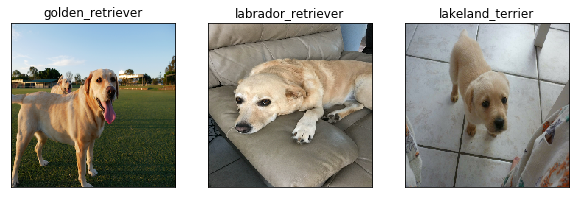

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)